Installation:
conda install jupyter

conda install scikit-image

conda install -c plotly plotly=4.10.0

pip install napari[all]

pip install numpy scipy matplotlib pandas scanpy PyQt5

In [1]:
import numpy as np
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import skimage
import tifffile
import skimage.feature as ft
%gui qt5
import napari
import plotly.graph_objs as go
import plotly.offline as py
import plotly.express as px
import imageio
import scipy.ndimage as ndimage
import scipy as sp

In [2]:
data='PlanariaAv2/'

In [3]:
beads = '\\\\ion/solexa-analysis/slideseq/210113_14/'

Configure some display stuff for scanpy

In [4]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
#sc.logging.print_versions()
#sc.settings.set_figure_params(dpi=80, facecolor='white', figsize=[15,15])

# Plotly and Napari

In [5]:
viewer = napari.Viewer()

Validation errors in config file(s).
The following fields have been reset to the default value:

plugins -> call_order
  none is not an allowed value (type=type_error.none.not_allowed)



In [6]:
def clear_layers():
    for i in range(0, len(viewer.layers)):
        viewer.layers.remove(0)

In [7]:
def view_image(X, Y, Counts, Name):
    img=np.zeros([1+np.max(aller[:,0]), 1+np.max(aller[:,1])])
    img[X,Y]=Counts
    dimg = ndimage.maximum_filter(img, size=8)
    viewer.add_image(dimg)
    viewer.layers[-1].contrast_limits=[0,300]
    viewer.layers[-1].blending='additive'
    viewer.layers[-1].colormap='green'
    viewer.layers[-1].name=Name

## Load data, display beads

Plot all beads

In [8]:
with open(beads+'BeadLocations.txt', "r") as myfile:
    aller_beads = myfile.readlines()
aller = np.array([np.array(str(s).split(',')) for s in aller_beads])
aller = aller.astype(float).T    
aller = np.round(aller).astype(int)

In [9]:
img=np.zeros([1+np.max(aller[:,0]), 1+np.max(aller[:,1])])
img[aller[:,0],aller[:,1]]=10
aimg = ndimage.maximum_filter(img, size=8)
base_img=img

In [10]:
clear_layers()
viewer.add_image(aimg)
viewer.layers[0].contrast_limits=[0,50]
viewer.layers[0].blending='additive'
viewer.layers[0].colormap='green'

Load data, load bead count data, make image of total counts for each bead.

In [11]:
#cdata=sc.read_csv(data+'ss_counts.csv')
#gene_img = np.transpose(cdata.X)

In [12]:
hvadata = sc.read(data+'hvadata.h5ad')
adata = sc.read(data+'adata.h5ad')

In [13]:
pos_df=pd.read_csv(data+'masked_coords.csv')
pos_df['IntX']=np.floor(pos_df['x']*1).astype(int)
pos_df['IntY']=np.floor(pos_df['y']*1).astype(int)
#pos_df['Counts']=np.sum(gene_img, axis=1)
pos_df['Counts']=adata.obs['total_counts'].values

In [14]:
img=np.zeros([1+np.max(aller[:,0]), 1+np.max(aller[:,1])])
img[pos_df['IntX'],pos_df['IntY']]=1+pos_df['Counts']
dimg = ndimage.maximum_filter(img, size=8)
base_img=img

In [15]:
viewer.add_image(dimg)
viewer.layers[-1].contrast_limits=[0,300]
viewer.layers[-1].blending='additive'
viewer.layers[-1].colormap='magenta'

In [16]:
adata.xpos = adata.obs.merge(pos_df, left_index=True, right_on = 'cells')['x'].values
adata.ypos = adata.obs.merge(pos_df, left_index=True, right_on = 'cells')['y'].values

hvadata.xpos = hvadata.obs.merge(pos_df, left_index=True, right_on = 'cells')['x'].values
hvadata.ypos = hvadata.obs.merge(pos_df, left_index=True, right_on = 'cells')['y'].values

In [17]:
df = pd.DataFrame({'UMAPx':hvadata.obsm['X_umap'][:,0], 'UMAPy':hvadata.obsm['X_umap'][:,1], 
                   'X':hvadata.xpos, 'Y':hvadata.ypos, 'Cluster':hvadata.obs['leiden'].values,
                  'Counts':hvadata.obs['total_counts'].values, 'Unnamed: 0':hvadata.obs.index})

adf = pd.DataFrame({'X':adata.xpos, 'Y':adata.ypos, 
                  'Counts':adata.obs['total_counts'].values})

In [18]:
real_vals = sp.sparse.csr_matrix.toarray(adata.X)

Uncomment to get the umap data from Bioinformatics' analysis of the slideseq

Uncomment to get the cluster assignment data from the SC->SS merge

In [19]:
#clusters_SC = pd.read_csv(data+'SC_Class_Probs.csv')
#df = df.merge(clusters_SC, on='Unnamed: 0', how='left')
#df.iloc[:,7:] = df.iloc[:,7:].fillna(0)



In [20]:
#for c in df.columns[7:]:
#    view_image((df['X'].values.astype(int)), 
#                   (df['Y'].values.astype(int)),
#                  255*df[c].values,
#                  'SC_' + c)
#    viewer.layers[-1].contrast_limits=[0,180]
#    viewer.layers[-1].visible=False
#types = df.columns.values[7:]
#df['Type'] = types[np.argmax(df.iloc[:,7:].to_numpy(), axis=1)]    

## Just plot all the clusters

In [21]:
f = go.FigureWidget(px.scatter(df, x='UMAPx', y='UMAPy', color='Cluster',  
                               hover_data=['X', 'Y', 'Cluster'], height=600))
f.show()

for cluster in df['Cluster'].unique():
    in_cluster = df['Cluster']==cluster
    view_image((df.loc[in_cluster]['X'].values.astype(int)), 
                   (df.loc[in_cluster]['Y'].values.astype(int)),
                  df.loc[in_cluster]['Counts'].values,
                  'SMC_' + cluster)

## Plot clusters, interactive selection

In [57]:
import plotly.graph_objs as go
import plotly.offline as py

import pandas as pd
import numpy as np
from ipywidgets import interactive, HBox, VBox

py.init_notebook_mode()

f = go.FigureWidget(px.scatter(df, x='UMAPx', y='UMAPy', hover_data=['X', 'Y', 'Cluster'], 
                                color='Cluster', 
                               height=1000))
scatter = f.data[0]
lst=[]
def selection_fn(trace,points,selector):
    if (len(points.point_inds)>0):
        current_cluster = str(int(trace.customdata[0,2]))
        tdf=df[df['Cluster']==current_cluster]
        #t.data[0].cells.values = [tdf[points.point_inds][col] for col in ['X', 'Y']]
        view_image((tdf.iloc[points.point_inds]['X'].values.astype(int)), 
                   (tdf.iloc[points.point_inds]['Y'].values.astype(int)),
                  tdf.iloc[points.point_inds]['Counts'].values,
                  'Selection:Cluster '+current_cluster)
        lst.append(current_cluster)
        lst.append(points.point_inds)

for s in range(len(f.data)):
    f.data[s].on_selection(selection_fn)

# Put everything together
f

FigureWidget({
    'data': [{'customdata': array([[1956.3, 2330.8, '0'],
                                   [2…

#### Visualize enriched genes for selection

In [24]:
point_mask = df.index.isin(df[df['Cluster']==lst[-2]].iloc[lst[-1]].index)
logratio = np.mean(real_vals[point_mask], axis=0)/np.mean(real_vals[~point_mask], axis=0)
#logratio = np.mean(adata.X[df['Cluster'] == cluster_no], axis=0)/np.mean(adata.X[df['Cluster'] == '10'], axis=0)
mask = np.mean(real_vals[point_mask], axis=0)>0.5
logratio = logratio * mask.astype(int)
logidx = np.argsort(-logratio)

for i in range(0,10):
    gene = adata.var.index[logidx[i]]
    print([gene, logratio[logidx[i]]])
    view_image((adf['X'].values.astype(int)), 
                   (adf['Y'].values.astype(int)),
                  500*real_vals[:,adata.var.index==gene][:,0]/np.max(real_vals[:,adata.var.index==gene][:,0]),
                  gene)
for i in range(0,10):
    viewer.layers[-(i+1)].visible=False 

C:\Users\smc\Anaconda3\envs\scanpy\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning:

divide by zero encountered in true_divide

C:\Users\smc\Anaconda3\envs\scanpy\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning:

invalid value encountered in true_divide

C:\Users\smc\Anaconda3\envs\scanpy\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning:

invalid value encountered in multiply



['HBA-X', 33.73696517944336]
['HBB-Y', 29.0281925201416]
['HBA-A2', 5.781538963317871]
['HBA-A1', 5.031547546386719]
['FTL1', 2.968579053878784]
['ALAS2', 2.900757074356079]
['HBB-BS', 2.804356336593628]
['BPGM', 2.4418106079101562]
['SNCA', 2.328456163406372]
['EPB41', 2.279118537902832]


## Draw on image, find in UMAP

In [58]:
ff = px.scatter(df, x='UMAPx', y='UMAPy', color='Cluster',  
                               hover_data=['X', 'Y', 'Cluster'], height=600)
ff.update_traces(opacity=0.12)
from matplotlib.path import Path

path = Path(viewer.layers[-1].data[-1])
contained=path.contains_points(df[['X', 'Y']])

tdf = df.copy()
tdf['Color'] = 0.2
ff.add_trace(px.scatter(tdf[contained], x='UMAPx', y='UMAPy',  
                               hover_data=['X', 'Y', 'Cluster'], height=600,
                        color_discrete_sequence=['#000000'],
                        size='Color', size_max=5
                               ).data[0])
ff.data[-1].update(opacity=1)
ff.show()

## Show marker genes for a specific cluster

In [22]:
gene_list = pd.DataFrame(hvadata.uns['rank_genes_groups']['names'])

In [23]:
gene_list.to_csv(data+'ClusterGeneList.csv')
gene_list

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,SMED30027940,SMED30029432,SMED30030799,SMED30029763,SMED30003372,SMED30027845,SMED30005552,mmp1,SMED30012544,SMED30004267,SMED30017940,SMED30011134,SMED30005457,SMED30025808,SMED30012409,SMED30007522,SMED30009457,SMED30026811,SMED30005670
1,SMED30020538,SMED30027460,SMED30000967,piwi-1,SMED30013591,SMED30027385,SMED30004574,mmp2,SMED30012044,SMED30009801,SMED30012713,SMED30022716,SMED30003335,SMED30020703,SMED30030663,SMED30030540,SMED30026600,SMED30005936,SMED30031804
2,SMED30021222,SMED30002983,SMED30018899,piwi-2,SMED30021445,SMED30026765,SMED30010096,Ast4,SMED30008009,AGAT-1,SMED30004348,SMED30033641,SMED30028912,SMED30002330,SMED30027315,SMED30022384,SMED30011308,Dj-mhc-1,SMED30029626
3,SMED30031804,SMED30001807,SMED30014558,SMED30019803,SMED30020778,SMED30002912,SMED30012522,Ast6,tolloid-like-1,SMED30028287,Dj-inx9,SMED30018281,SMED30030799,SMED30007629,SMED30033093,SMED30029763,SMED30010682,SMED30004470,Ast8
4,SMED30002049,Dj-mhc,SMED30007704,SMED30029741,SMED30002547,SMED30025073,SMED30008560,SMED30005188,SMED30008568,"H.56.4h, AGAT-2",SMED30029848,SMED30029867,SMED30018899,SMED30010561,"H.2.8b, crocc",SMED30002596,SMED30005324,SMED30016186,SMED30003335
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,SMED30008729,SMED30026425,SMED30019388,SMED30005453,SMED30002414,SMED30032815,SMED30021524,SMED30015158,SMED30035652,SMED30029680,SMED30019288,SMED30008693,SMED30023413,SMED30015789,SMED30034692,SMED30018770,SMED30027198,SMED30007431,SMED30032365
996,SMED30017240,SMED30004085,SMED30020046,SMED30034340,SMED30033750,SMED30024980,Dj-inx5,SMED30022348,SMED30019332,SMED30004353,SMED30001702,SMED30026289,SMED30021504,SMED30030542,SMED30015426,SMED30002319,SMED30012089,SMED30016616,SMED30012874
997,SMED30026167,SMED30007869,SMED30003427,SMED30017251,SMED30023973,SMED30018248,SMED30003956,SMED30035855,SMED30005804,SMED30021601,SMED30018702,SMED30026287,SMED30009612,SMED30007802,SMED30013289,SMED30029545,SMED30013621,SMED30034618,SMED30020068
998,SMED30011766,SMED30013149,SMED30034921,SMED30023463,SMED30034215,SMED30010810,SMED30032115,SMED30018861,SMED30027780,SMED30028575,SMED30013641,SMED30003092,SMED30018667,SMED30018034,SMED30006749,SMED30029936,SMED30005502,SMED30034370,SMED30016288


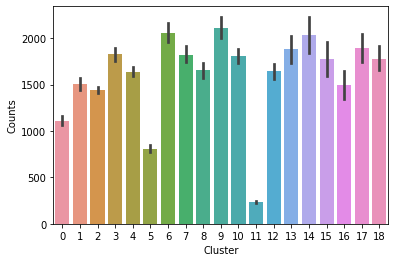

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.barplot(data=df[df['Cluster'].astype(int)<30], x='Cluster', y='Counts')
plt.savefig(data+'ClusterCounts.pdf')

### Gene images for enriched in cluster

Using Scanpy's gene rankings

In [26]:
cluster_no = '3'

In [27]:
gene_list = pd.DataFrame(hvadata.uns['rank_genes_groups']['names'])[cluster_no].values[0:10]

for gene in gene_list:
    view_image((adf['X'].values.astype(int)), 
                   (adf['Y'].values.astype(int)),
                  500*real_vals[:,adata.var.index==gene][:,0]/np.max(real_vals[:,adata.var.index==gene][:,0]),
                  gene)
for i in range(0,10):
    viewer.layers[-(i+1)].visible=False  
gene_list    

array(['SMED30029763', 'piwi-1', 'piwi-2', 'SMED30019803', 'SMED30029741',
       'SMED30005171', 'SMED30025522', 'piwi-3', 'SMED30013233', 'HP1-1'],
      dtype=object)

Using simple logratios

In [41]:
logratio = np.mean(real_vals[df['Cluster'] == cluster_no], axis=0)/np.mean(real_vals[df['Cluster'] == '1'], axis=0)
#logratio = np.mean(adata.X[df['Cluster'] == cluster_no], axis=0)/np.mean(adata.X[df['Cluster'] == '10'], axis=0)
mask = np.mean(real_vals[df['Cluster']==cluster_no], axis=0)>0.5
logratio = logratio * mask.astype(int)
logidx = np.argsort(-logratio)

for i in range(0,10):
    gene = adata.var.index[logidx[i]]
    print([gene, logratio[logidx[i]]])
    view_image((adf['X'].values.astype(int)), 
                   (adf['Y'].values.astype(int)),
                  500*real_vals[:,adata.var.index==gene][:,0]/np.max(real_vals[:,adata.var.index==gene][:,0]),
                  gene)
for i in range(0,10):
    viewer.layers[-(i+1)].visible=False    


C:\Users\smc\Anaconda3\envs\scanpy\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning:

divide by zero encountered in true_divide

C:\Users\smc\Anaconda3\envs\scanpy\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning:

invalid value encountered in true_divide

C:\Users\smc\Anaconda3\envs\scanpy\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning:

invalid value encountered in multiply



['MKRN1', 2.3158273696899414]
['BPGM', 2.0077016353607178]
['SLC25A37', 1.8625401258468628]
['SNCA', 1.7578481435775757]
['SLC4A1', 1.5190441608428955]
['PABPC1', 1.493043065071106]
['FTH1', 1.1994836330413818]
['GLRX5', 1.1047307252883911]
['HBB-BT', 0.9726220369338989]
['MT2', 0.9033968448638916]


# Smoothing test

Get the 10D UMAP embedding file

In [23]:
deeper_UMAP = np.load(data+'UMAP.npy')

Compute the distance matrix

In [24]:
dist_matrix = sp.spatial.distance.pdist(deeper_UMAP)
dist_matrix = sp.spatial.distance.squareform(dist_matrix)

Make gaussian blur matrices

In [25]:
#weight_matrix_01 = np.exp(-1*(dist_matrix**2)/0.1**2)
weight_matrix_02 = np.exp(-1*(dist_matrix**2)/0.2**2)
#weight_matrix_035 = np.exp(-1*(dist_matrix**2)/0.35**2)
#weight_matrix_05 = np.exp(-1*(dist_matrix**2)/0.5**2)
#weight_matrix_1 = np.exp(-1*(dist_matrix**2)/1**2)

Matrix multiply the distance matrices and the blur matrices

In [26]:
#smoothed_data_01 = np.matmul(weight_matrix_01, real_vals)
smoothed_data_02 = np.matmul(weight_matrix_02, real_vals)
#smoothed_data_035 = np.matmul(weight_matrix_035, real_vals)
#smoothed_data_05 = np.matmul(weight_matrix_05, real_vals)
#smoothed_data_1 = np.matmul(weight_matrix_1, real_vals)


In [27]:
np.save(data+'real_vals.npy', real_vals)
np.save(data+'smoothed_data_02.npy', smoothed_data_02)

In [43]:
gene_list = ['ZPUF-6', 'piwi-1', 'piwi-2', 'piwi-3', 'AGAT-1', 'porcn-A', 'SMED30025067']

# Show a gene list for one of the smoothed images

In [23]:

for gene in gene_list[0:100]:
    view_image((adf['X'].values.astype(int)), 
                   (adf['Y'].values.astype(int)),
                  500*real_vals[:,adata.var.index==gene][:,0]/np.max(real_vals[:,adata.var.index==gene][:,0]),
                  gene + '')
    #viewer.layers[-1].name = viewer.layers[-1].name+'_'+str(midx)  
for i in range(0,10):
    viewer.layers[-(i+1)].visible=False  
gene_list    

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99


Index(['RBP1', 'GLI-3', 'crf-r', 'Smed_09132', 'CEP72', 'Smed_05789',
       'Dj-inx3', 'spp-15', 'six6*', 'Dj-GADA',
       ...
       'litaf', 'Smed_14471', 'follistatin', 'NLK-1', 'activin-2', 'Ast7',
       'npy-5', 'nlg-7', 'NB.21.11e, prog-1', 'Smed_09274'],
      dtype='object', name='Alias', length=400)

In [ ]:
df['Gene'] = 0.01+real_vals[:,adata.var.index=='PROCR']
px.scatter(df, x='UMAPx', y='UMAPy', color='Cluster',  
                               hover_data=['X', 'Y', 'Cluster', 'Gene'], size='Gene', height=600)

Save all of them to tif

In [21]:
gene_list = adata.var.index[adata.var.index.str.contains('SMED') == False]

In [35]:
for gene in gene_list:
    img=np.zeros([1+np.max(aller[:,0]), 1+np.max(aller[:,1])])

    img[adf['X'].values.astype(int),adf['Y'].values.astype(int)]=real_vals[:,adata.var.index==gene][:,0]
    dimg = ndimage.maximum_filter(img, size=8)
    main_img=dimg
    
    if ('*' in gene) or ('/' in gene):
        print(gene)
    else:        
        print(gene)
        tifffile.imsave(data+'output/'+gene+'.tif', main_img.astype(np.single), imagej=True)  

RBP1
GLI-3
crf-r
Smed_09132
CEP72
Smed_05789
Dj-inx3
spp-15
six6*
Dj-GADA
Spol-SoxB1-2
da
spp-16
piwi-3
Dj-GluR1
WntP-3, Wnt11-4
spp-13
Smed_04136
npp-5
bruli-1
NB.32.1g, prog-2
Ast1
Spol-gata456b
prog1-6
nlg-2
ppp-1
ascl-2
mpl-2
NB.22.1e, prog-1
pcdhP-4
isl-1
syk
NEK8-1
eIF4a-like
X1.A.C4.1
gna-o
slc12a-4
dlx
Smed_34076
Smed_12199
Dj-inx3-1
Dj-inx2
PCNA
eag
neuroD-2
Smed_13405
nlg-3
Ast2
coe
ptf-4
cyclin-B2
pmp-10
slc17a-1
slc8a-2
six1/2-2
hnf-4
hesl-2
nkx1
bambi
X1.C3.3
Spol-TBX2/3b
Smed_01915
slc24a-4
cdkl1
POC5
cdc25-1
hesl-1
foxJ*
TCF15
asic
tyrosinase
TCEN
dpy30-1
Dj-inx5
mcm2
Dj-PLOX3
gata456a
otxA
maguk
piwi-1
lectin-like
smad6/7-1
Ast6
pmca2
pmp-6
slc36a-1
RTEL1
slc1a-4
sox9-1, soxP-3
myoD
gucy-2
inx1
ilp-1
twist
npp-8
spp-3
FGFR4
prog2-2
inhibin-1
1020HH-1
spp-5
H.56.4h, AGAT-2
bmp-like
NSD-1
hesl-3
EGFR1
pitx
Smed_08711
Dj-inx7
npp-2
RRM2-2
tolloid-like-1
Dj-SNAP-25
wdr82-2
pmp-5
Dj-inx3-2
Znf91
hmctn
1.G9.2
meis2*
six3-1
pou6*-2
prog1-5
GLI-1
Evi, Wls
Smed_32930
mll5-2
H.18

In [63]:

main_img=np.zeros([6,1+np.max(aller[:,0]), 1+np.max(aller[:,1])])
for gene in gene_list:
    img=np.zeros([1+np.max(aller[:,0]), 1+np.max(aller[:,1])])

    img[adf['X'].values.astype(int),adf['Y'].values.astype(int)]=real_vals[:,adata.var.index==gene][:,0]
    dimg = ndimage.maximum_filter(img, size=8)
    main_img[0]=dimg
    
    img[adf['X'].values.astype(int),adf['Y'].values.astype(int)]=smoothed_data_01[:,adata.var.index==gene][:,0]
    dimg = ndimage.maximum_filter(img, size=8)
    main_img[1]=dimg
    
    img[adf['X'].values.astype(int),adf['Y'].values.astype(int)]=smoothed_data_02[:,adata.var.index==gene][:,0]
    dimg = ndimage.maximum_filter(img, size=8)
    main_img[2]=dimg
    
    img[adf['X'].values.astype(int),adf['Y'].values.astype(int)]=smoothed_data_035[:,adata.var.index==gene][:,0]
    dimg = ndimage.maximum_filter(img, size=8)
    main_img[3]=dimg
    
    img[adf['X'].values.astype(int),adf['Y'].values.astype(int)]=smoothed_data_05[:,adata.var.index==gene][:,0]
    dimg = ndimage.maximum_filter(img, size=8)
    main_img[4]=dimg
    
    img[adf['X'].values.astype(int),adf['Y'].values.astype(int)]=smoothed_data_1[:,adata.var.index==gene][:,0]
    dimg = ndimage.maximum_filter(img, size=8)
    main_img[5]=dimg
    
    tifffile.imsave(data+'Genes/'+gene+'.tif', main_img)    


Save all the existing napari images for ImageJ tiffs

In [46]:
for layer in viewer.layers:
    tifffile.imsave(data+'output/'+layer.name+'.tif', layer.data.astype(np.single), imagej=True)    